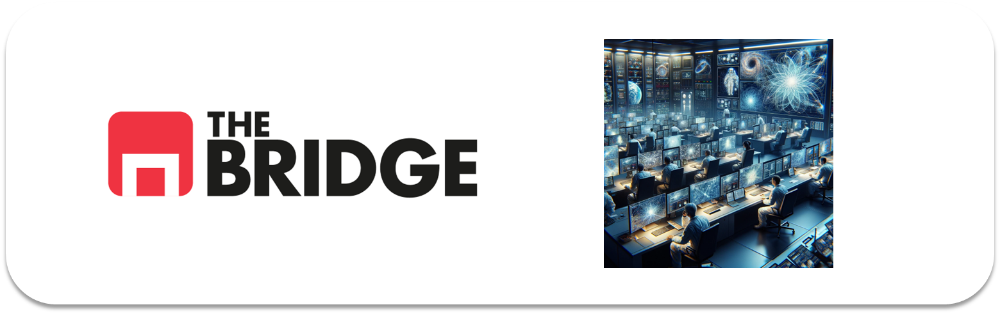

In [8]:
import tensorflow as tf

# Configurar la GPU antes de inicializar TensorFlow
physical_devices = tf.config.list_physical_devices('GPU')
tf.config.experimental.set_memory_growth(physical_devices[0], True)

*RECUERDA QUE ESTE NOTEBOOK ES PARA QUE LO EJECUTES EN TU ORDENADOR, NO EN LA PLATAFORMA*


## Transfer Learning y Fine Tuning

Como hemos visto en la teoria, una de las capacidades más potentes de los modelos DL es que podemos apoyarnos en modelos preentrenados (o preconstruidos si solo queremos su topología). En las siguientes sesiones vamos a emplear dos modelos de este tipo de redes convolucionales especializadas en la clasifiación de imagénes para mostrar los conceptos de transfer y fine tuning.

### Principales arquitecturas convolucionales

Al finalizar la unidad anterior vimos cuatro arquitecturas de referencia de las cuales hoy en día hay buenas evoluciones:

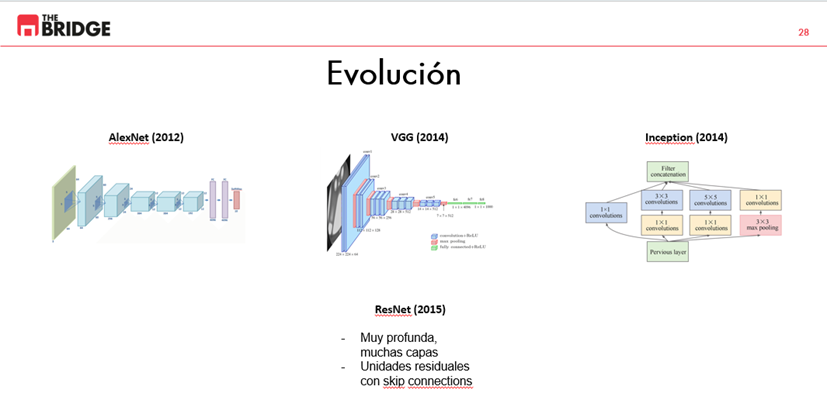

Y hoy en día son arquitecturas basadas en las anteriores la más utilizadas en la comunidad:
* VGG-16
* VGG-19
* Inception V3
* XCeption
* ResNet-50

Para más detalle sobre el funcionamiento de cada red, consultar el [Hands on Machine Learning for Python](https://learning.oreilly.com/library/view/hands-on-machine-learning/9781492032632/ch14.html#cnn_chapter).

NOTA: Un detalle es que estas redes las puedes bajar sólo su topología o con los pesos preentrenados.


### Primera carga y Zero-Shot Learning

La primera arquitectura que vamos a ver corresponde a la **ResNet50V2**. Además lo primero que vamos a intentar con ella es un zero-shot learning que básicamente consiste en bajar la red preentrenada coger nuestros datos, adaptarlos a las dimensiones de entrada de la ResNet y hacer predicciones directamente.

<img src="./img/ResNet50.png" alt="drawing" width="600"/>

Lo primero es hacer nuestros "imports", fijate que además de los habituales importamos skimage y cv2 para poder ver y tratar las imágenes:

In [9]:
import cv2
import matplotlib.pyplot as plt
import numpy as np
import os
import pandas as pd
import tensorflow as tf



from skimage.io import imread
from sklearn.model_selection import train_test_split
from tensorflow.keras.preprocessing import image
from tensorflow.keras import datasets, layers, models




Y ahora nos descargamos "el modelo" (realmente es un clase que cargará el modelo al inicializarse):

In [10]:
from tensorflow.keras.applications.resnet_v2 import ResNet50V2, decode_predictions, preprocess_input

In [11]:

'''
imagenet es un corpus de imagenes con el que se ha clasificado el ResNet50V2
http://www.image-net.org/

Cargamos toda la red ya entrenada, y la usaremos para predecir
include_top=True --> Para que incluya la fully connected layer.
include_top=False --> Desarrollamos la fully connected layer
ojo el input shape que sea el de las imagenes que introduciremos. Esta limitado a imagenes de tamaño 224x224
classifier_activation se usa si include_top=True
'''

base_model = ResNet50V2(input_shape=(224, 224,3),
                        include_top=True, # Como vamos a emplearla directamente, incluimos también la parte de capas densas que hacen la predicción en este caso clasificación de imagenes 
                        weights="imagenet", # Se carga con los pesos entrenados para el dataset de imagenet
                        classifier_activation="softmax")

In [12]:
base_model.summary()

Model: "resnet50v2"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_2 (InputLayer)            [(None, 224, 224, 3) 0                                            
__________________________________________________________________________________________________
conv1_pad (ZeroPadding2D)       (None, 230, 230, 3)  0           input_2[0][0]                    
__________________________________________________________________________________________________
conv1_conv (Conv2D)             (None, 112, 112, 64) 9472        conv1_pad[0][0]                  
__________________________________________________________________________________________________
pool1_pad (ZeroPadding2D)       (None, 114, 114, 64) 0           conv1_conv[0][0]                 
_________________________________________________________________________________________

Cargamos algunas imagenes desde local, para ver qué tal funciona la red ResNet50V2 ya entrenada.

funcion para rescalar las imagenes al formato que necesitamos

In [13]:
import os

tipos = []

def read_data(path):
    X = []

    for file in [file for file in os.listdir(path) if file.endswith(".jpg") or file.endswith(".jpeg")]:
        image = imread(path + '/' + file)
        smallimage = cv2.resize(image, (224, 224))
        print(path + '/' + file)
        tipos.append(file)
        
        X.append(smallimage)

    return np.array(X)
    

x_figs = read_data(r'D:\Cursos\REPOSITORIOS\ONLINE_DS_THEBRIDGE_V\SPRINT_19_DL_APLICADO_IMAGENES\UNIT1\TRABAJO\data\github_test')

# Procesar las imagenes tal y como entran en el modelo
x_test = preprocess_input(x_figs)
print(x_test.shape)

D:\Cursos\REPOSITORIOS\ONLINE_DS_THEBRIDGE_V\SPRINT_19_DL_APLICADO_IMAGENES\UNIT1\TRABAJO\data\github_test/cat.10705.jpg
D:\Cursos\REPOSITORIOS\ONLINE_DS_THEBRIDGE_V\SPRINT_19_DL_APLICADO_IMAGENES\UNIT1\TRABAJO\data\github_test/cat.10711.jpg
D:\Cursos\REPOSITORIOS\ONLINE_DS_THEBRIDGE_V\SPRINT_19_DL_APLICADO_IMAGENES\UNIT1\TRABAJO\data\github_test/cat.10714.jpg
D:\Cursos\REPOSITORIOS\ONLINE_DS_THEBRIDGE_V\SPRINT_19_DL_APLICADO_IMAGENES\UNIT1\TRABAJO\data\github_test/cat.10715.jpg
D:\Cursos\REPOSITORIOS\ONLINE_DS_THEBRIDGE_V\SPRINT_19_DL_APLICADO_IMAGENES\UNIT1\TRABAJO\data\github_test/cat.10716.jpg
D:\Cursos\REPOSITORIOS\ONLINE_DS_THEBRIDGE_V\SPRINT_19_DL_APLICADO_IMAGENES\UNIT1\TRABAJO\data\github_test/cat.10717.jpg
D:\Cursos\REPOSITORIOS\ONLINE_DS_THEBRIDGE_V\SPRINT_19_DL_APLICADO_IMAGENES\UNIT1\TRABAJO\data\github_test/cat.10724.jpg
D:\Cursos\REPOSITORIOS\ONLINE_DS_THEBRIDGE_V\SPRINT_19_DL_APLICADO_IMAGENES\UNIT1\TRABAJO\data\github_test/cat.10726.jpg
D:\Cursos\REPOSITORIOS\ONLINE_DS

In [14]:
def plot_image(i, class_predicted, class_prob, true_label, img):
  img = img[i]
  plt.grid(False)
  plt.xticks([])
  plt.yticks([])

  plt.imshow(img, cmap=plt.cm.binary)

  plt.xlabel(f"{class_predicted} {class_prob:.2f} ({true_label})")

def plot_value_array(predictions_array, predictions_labels):
  #predictions_array, true_label = predictions_array, true_label[i]
  plt.grid(False)
  plt.xticks(range(len(predictions_labels)),labels = predictions_labels)
  plt.yticks([])
  thisplot = plt.bar(range(len(predictions_array)), predictions_array, color="#777777")
  plt.ylim([0, 1])
  plt.xlabel("top-5 predicciones")

  #thisplot[predicted_label].set_color('red')
  #thisplot[true_label].set_color('blue')

Ahora predecimos sobre las imagenes nuestras, como puedes ver, sin tocar nada más en el modelo

In [15]:
num_rows = len(x_test)
num_cols = 1
num_images = num_rows * num_cols

#plt.figure(figsize=(40, 40))

preds = base_model.predict(x_test)



Y mostramos cada imagen y el nivel de confianza en las etiquetas top que puede dar ResNet

ahoea este codifo nos calsifica la prediciones y el nivel de confianza que tiene

c:\Users\victo\miniconda3\envs\tf-gpu\lib\site-packages\ipykernel_launcher.py:10: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  # Remove the CWD from sys.path while we load stuff.
c:\Users\victo\miniconda3\envs\tf-gpu\lib\site-packages\ipykernel_launcher.py:16: UserWarning: Tight layout not applied. tight_layout cannot make axes height small enough to accommodate all axes decorations.
  


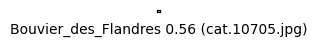

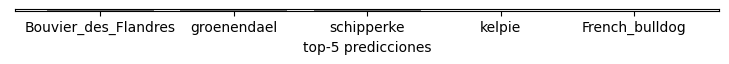

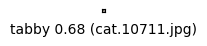

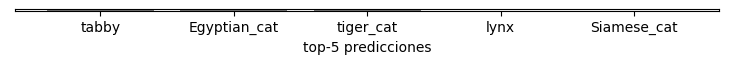

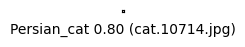

...

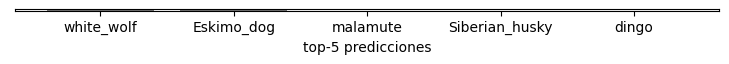

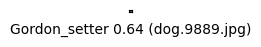

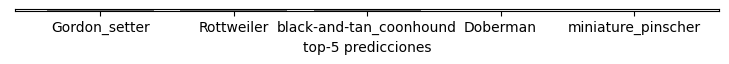

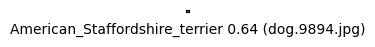

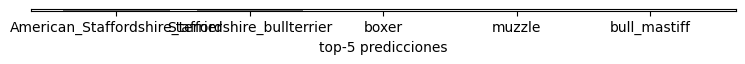

In [16]:
# decode the results into a list of tuples (class, description, probability)
decodes = decode_predictions(preds, top=5)

for i,j in enumerate(decodes):
    prediction_proba = []
    predicted_classes = []
    for decode in j:
        prediction_proba.append(decode[2])
        predicted_classes.append(decode[1])
    plt.figure(figsize=(40, 40))
    plt.subplot(num_rows, 2*num_cols, 2*i+1)
    plot_image(i,predicted_classes[0],prediction_proba[0],tipos[i],x_figs)
    plt.figure(figsize=(20, 20))
    plt.subplot(num_rows, 2*num_cols, 2*i+2)
    plot_value_array(prediction_proba, predicted_classes)
plt.tight_layout()
plt.show()

En algunos casos los resultados son muy buenos en otros son "raros", por ejemplo la "Pajarita" de James Bond. No siempre podremos hacer un zero-shot de hecho eso está siendo ahora con los LLMs con los que realmente está funcionando.

***

### Transfer Learning

Si recuerdas en el transfer a diferencia del shot, vamos a mantener el modelo quitándole su "cabeza" densa y colocando una que entrenaremos con nuestros datos. Pues vamos a ello.

NOTA: No todos los modelos tienen la misma forma de hacer el transfer o el fine tuning que vamos a enseñar aquí, la filosofía es la misma pero los pasos pueden diferir por implementación, datos, etc. Cuando quieras recurrir a este sistema deberás leer las instrucciones que acompañen al modelo escogido en el repositorio del que te lo vayas a descargar. 

Para este caso vamos a emplear el modelo basado en la arquitectura **VGG**:

<img src="./img/vgg16.png" alt="drawing" width="150"/>

Y los datos de imagenes de perros y gatos de la práctica obligatoria pasada, así que cambia el path de la celda siguiente para que apunte al lugar donde tengas las imagenes de train de esa práctica

In [17]:


IM_SIZE=64# tamaña de las imagenes que vamos atrabajar

TRAIN_PATH = r"D:\Cursos\REPOSITORIOS\ONLINE_DS_THEBRIDGE_V\SPRINT_19_DL_APLICADO_IMAGENES\UNIT2\train"
filenames = os.listdir(TRAIN_PATH)
categories = []

for filename in filenames:
    category = filename.split('.')[0]
    categories.append(category)
    
df = pd.DataFrame({#nos creremos el nombre del figrero y a que categoria pertenece
    'filenames': filenames,
    'category': categories
})

train_df, validate_df = train_test_split(df,
                                         test_size=0.20,
                                         random_state=42)

train_df = train_df.reset_index(drop=True)
validate_df = validate_df.reset_index(drop=True)

Para poder mejorar la generalización del modelo vamos a emplear aumentado de imágenes:

In [18]:
from tensorflow.keras.preprocessing.image import ImageDataGenerator


# Add our data-augmentation parameters to ImageDataGenerator
train_datagen = ImageDataGenerator(rescale = 1./255.,
                                   rotation_range = 40, # Rotacion en grados
                                   width_shift_range = 0.2, # Desplazamiento a lo ancho
                                   height_shift_range = 0.2,
                                   shear_range = 0.2, # Intensidad del angulo de rotacion
                                   zoom_range = 0.2,
                                   horizontal_flip = True)

# Note that the validation data should not be augmented!
validation_datagen = ImageDataGenerator(rescale = 1.0/255. )

Una de las ventajas de los generadores de imágenes sintéticas de tensorflow es que pueden leer imágenes a partir de fichero en vez de tener que pasarles directamente los arrays de cada una de ellas.

In [19]:
# Flow training images in batches of 20 using train_datagen generator
train_generator = train_datagen.flow_from_dataframe(train_df,
                                                    TRAIN_PATH, # Donde busscar todo esto
                                                    x_col='filenames', # Nombres de archivos
                                                    y_col='category', # Target
                                                    batch_size = 20,
                                                    class_mode = 'binary',
                                                    target_size = (IM_SIZE, IM_SIZE))

# Flow validation images in batches of 20 using test_datagen generator
validation_generator = validation_datagen.flow_from_dataframe(validate_df,
                                                              TRAIN_PATH,
                                                              x_col='filenames',
                                                              y_col='category',
                                                              batch_size = 20,
                                                              class_mode = 'binary',
                                                              target_size = (IM_SIZE, IM_SIZE))

Found 921 validated image filenames belonging to 2 classes.
Found 231 validated image filenames belonging to 2 classes.


Cargamos el modelo como hicimos antes con ResNet

In [20]:
from tensorflow.keras.applications.vgg16 import VGG16# tipo de modelo q nos hemos instanciamos

base_model = VGG16(input_shape = (IM_SIZE, IM_SIZE, 3), # Shape of our images(64,64,3)
                    include_top = False, # no le vamos pedir las cabezas de las cappas
                    weights = 'imagenet')


Fijate en el argumento include_top, está puesto ahora a False para poder quitar la cabecera densa de la VGG. Ahora tenemos que añadirle la red densa que queramos entrenar nosotros, en este caso va a ser muy sencilla. Y para poder añadirla sobre el resto de la arquitectura de la VGG, recurrimos a la interfaz funcional que vimos el sprint anterior

Observa también que vamos a "congelar" las capas de la VGG, es decir no vamos a permitir que se entrenen haciendo lo siguiente:

In [21]:
for layer in base_model.layers:
    layer.trainable = False# con esto congelamos las capas, es decir los pesos son fijos y no se pueden cambiar
    


Y ahora ya sí nuestra modelo "tuneado":

In [22]:
##### FULLY CONNECTED LAYER #####
# Flatten the output layer to 1 dimension
x = layers.Flatten()(base_model.output)# lo que va hacer es meterle aplanado el modelo base entero que hemos instanciamos

# Add a fully connected layer with 512 hidden units and ReLU activation
x = layers.Dense(512, activation='relu')(x)

# Add a dropout rate of 0.5
x = layers.Dropout(0.5)(x)

# Add a final sigmoid layer for classification
x = layers.Dense(1, activation='sigmoid')(x)

model = tf.keras.models.Model(base_model.input, x)

model.compile(optimizer = 'adam',
              loss = 'binary_crossentropy',
              metrics = ['acc'])

In [23]:
model.summary()

Model: "model"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_3 (InputLayer)         [(None, 64, 64, 3)]       0         
_________________________________________________________________
block1_conv1 (Conv2D)        (None, 64, 64, 64)        1792      
_________________________________________________________________
block1_conv2 (Conv2D)        (None, 64, 64, 64)        36928     
_________________________________________________________________
block1_pool (MaxPooling2D)   (None, 32, 32, 64)        0         
_________________________________________________________________
block2_conv1 (Conv2D)        (None, 32, 32, 128)       73856     
_________________________________________________________________
block2_conv2 (Conv2D)        (None, 32, 32, 128)       147584    
_________________________________________________________________
block2_pool (MaxPooling2D)   (None, 16, 16, 128)       0     

Y ya ahora solo tenemos que entrenar:

In [24]:
vgghist = model.fit(train_generator,
                    validation_data = validation_generator,
                    steps_per_epoch = 100, # Cantidad de batches en los que divide el epoch
                    epochs = 1)

100/100 [==============================] - 5s 34ms/step - loss: 0.4990 - acc: 0.8708 - val_loss: 0.2913 - val_acc: 0.8918


Y tendríamos nuestro modelo sobre la VGG, vamos a evaluarlo (ahora si que vamos a convertir las imagenes a arrays de numpy):

In [25]:
TEST_PATH = r"D:\Cursos\REPOSITORIOS\ONLINE_DS_THEBRIDGE_V\SPRINT_19_DL_APLICADO_IMAGENES\UNIT1\TRABAJO\data\github_test"

def read_data(path, im_size):
    X = []
    Y = []

    for file in os.listdir(path):
        image = imread(path + '/' + file)
        smallimage = cv2.resize(image, (im_size,im_size))
        
        X.append(smallimage/255.)
        
        category = file.split('.')[0]
        if category == 'dog':
            Y.append(1)
        else:
            Y.append(0)

    return np.array(X), np.array(Y)
    

X_train, y_train = read_data(TRAIN_PATH, IM_SIZE)
X_test, y_test = read_data(TEST_PATH, IM_SIZE)

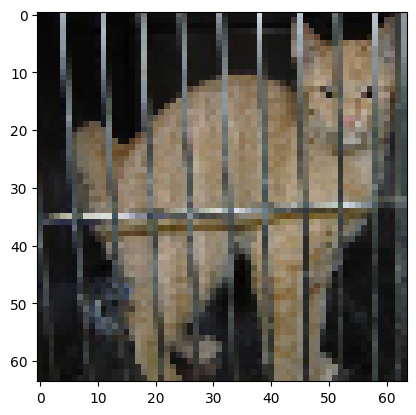

In [26]:
plt.imshow(X_train[12])

In [27]:
results = model.evaluate(X_test, y_test)
print("test loss, test acc:", results)

32/32 [==============================] - 2s 20ms/step - loss: 0.9086 - acc: 0.5040
test loss, test acc: [0.9085783958435059, 0.5040000081062317]


Bueno, no esta mal, pero igual podríamos hacer más... Veamos una segunda posibilidad dentro del transfer learning que ya roza bastante o se solapa con el fintuning

***

### Transfer Learning con entrenamiento de capas superiores

Veamos las capas de nuestro modelo (version del VGG):

In [28]:
for indice, layer in enumerate(model.layers):
    print("Capa %d: %s" %(indice, layer.name))

Capa 0: input_3
Capa 1: block1_conv1
Capa 2: block1_conv2
Capa 3: block1_pool
Capa 4: block2_conv1
Capa 5: block2_conv2
Capa 6: block2_pool
Capa 7: block3_conv1
Capa 8: block3_conv2
Capa 9: block3_conv3
Capa 10: block3_pool
Capa 11: block4_conv1
Capa 12: block4_conv2
Capa 13: block4_conv3
Capa 14: block4_pool
Capa 15: block5_conv1
Capa 16: block5_conv2
Capa 17: block5_conv3
Capa 18: block5_pool
Capa 19: flatten
Capa 20: dense
Capa 21: dropout
Capa 22: dense_1


En este caso vamos a reentrenar las últimas capas, las que corresponden al quinto bloque de la arqitectura

In [29]:
for layer in model.layers[15:19]:
    print(layer.name)
    layer.trainable = True

block5_conv1
block5_conv2
block5_conv3
block5_pool


In [30]:
model.compile(optimizer = tf.keras.optimizers.Adam(learning_rate=0.03),
              loss = 'binary_crossentropy',
              metrics = ['accuracy'])

Como los datos están sin barajar de partida:

In [31]:
from sklearn.utils import shuffle
X_train, y_train = shuffle(X_train, y_train, random_state=42)# sghuffle hace un randon de train pero co n los valores alineados


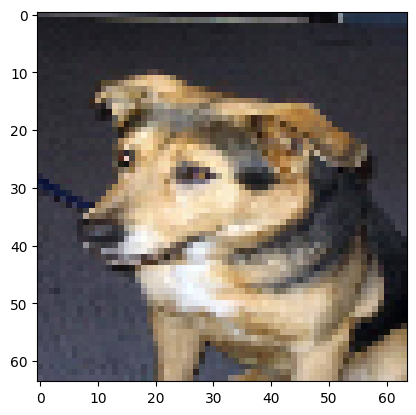

In [32]:
plt.imshow(X_train[56])

In [33]:
model.fit(X_train,y_train,
        validation_split= 0.2,
        batch_size = 32,
        #steps_per_epoch = 10, # Cantidad de batches en los que divide el epoch
        epochs = 10)

Epoch 1/10


29/29 [==============================] - 4s 55ms/step - loss: 13486.6416 - accuracy: 0.7459 - val_loss: 0.4332 - val_accuracy: 0.9177
Epoch 2/10
29/29 [==============================] - 1s 21ms/step - loss: 0.4334 - accuracy: 0.8817 - val_loss: 0.2860 - val_accuracy: 0.9177
Epoch 3/10
29/29 [==============================] - 1s 21ms/step - loss: 0.3689 - accuracy: 0.8827 - val_loss: 0.2886 - val_accuracy: 0.9177
Epoch 4/10
29/29 [==============================] - 1s 21ms/step - loss: 0.3693 - accuracy: 0.8827 - val_loss: 0.2894 - val_accuracy: 0.9177
Epoch 5/10
29/29 [==============================] - 1s 21ms/step - loss: 0.3663 - accuracy: 0.8827 - val_loss: 0.2889 - val_accuracy: 0.9177
Epoch 6/10
29/29 [==============================] - 1s 21ms/step - loss: 0.3681 - accuracy: 0.8827 - val_loss: 0.2883 - val_accuracy: 0.9177
Epoch 7/10
29/29 [==============================] - 1s 21ms/step - loss: 0.3616 - accuracy: 0.8827 - val_loss: 0.2869 - val_accuracy: 0.9177
Epoch 8/10
29/29 [==

In [34]:
model.evaluate(X_test,y_test)

 1/32 [..............................] - ETA: 0s - loss: 2.1977 - accuracy: 0.0000e+00

32/32 [==============================] - 0s 12ms/step - loss: 1.1577 - accuracy: 0.5000


[1.1577186584472656, 0.5]

Aquí termina la parte del transfer, en la siguiente sesión vamos a ver lo que sería un fine-tuning de las ResNet
***

### Fine-tuning: ResNet50V2 

Cargamos el modelo pero ajustándolo a imagenes de 32x32 y observa que no cargamos pesos en la red, solo la topología. Y tampoco nos quedamos con las cabezas superiores.

In [35]:
IM_SIZE=32

base_model = ResNet50V2(input_shape=(IM_SIZE, IM_SIZE,3),
                        include_top=False, # Importante!!
                        weights = None, # Importante!!
                        classifier_activation="softmax")

In [36]:
# Flatten the output layer to 1 dimension
x = layers.Flatten()(base_model.output)

# Add a fully connected layer with 512 hidden units and ReLU activation
x = layers.Dense(512, activation='relu')(x)

# Add a dropout rate of 0.5
x = layers.Dropout(0.5)(x)

# Add a final sigmoid layer for classification
x = layers.Dense(1, activation='sigmoid')(x)

model = tf.keras.models.Model(base_model.input, x)

model.compile(optimizer = tf.keras.optimizers.RMSprop(learning_rate=0.0001), loss = 'binary_crossentropy',metrics = ['acc'])



Volvemos a hacer uso del aumentado del dataset mediante la manipulación de las imagenes originales

In [37]:
# Flow training images in batches of 20 using train_datagen generator
train_generator = train_datagen.flow_from_dataframe(train_df,
                                                    TRAIN_PATH,
                                                    x_col='filenames',
                                                    y_col='category',
                                                    batch_size = 20,
                                                    class_mode = 'binary',
                                                    target_size = (IM_SIZE, IM_SIZE))

# Flow validation images in batches of 20 using test_datagen generator
validation_generator = validation_datagen.flow_from_dataframe(validate_df,
                                                              TRAIN_PATH,
                                                              x_col='filenames',
                                                              y_col='category',
                                                              batch_size = 20,
                                                              class_mode = 'binary',
                                                              target_size = (IM_SIZE, IM_SIZE))

Found 921 validated image filenames belonging to 2 classes.
Found 231 validated image filenames belonging to 2 classes.


In [38]:
history = model.fit(train_generator, validation_data = validation_generator, steps_per_epoch = 100, epochs = 10) # PAra reducir los tiempos de entrenamiento solo haremos epocas de 100 batches, de 20 datos o sea entrenamos con 2000 imagenes por época

Epoch 1/10
100/100 [==============================] - 18s 56ms/step - loss: 0.4074 - acc: 0.8762 - val_loss: nan - val_acc: 0.1082


Y ya estaría. Evidentemente, debes optar cambiar los hiperparámetros y ajustarlo lo más posible a tu problema y a correr.

In [39]:
model.evaluate(X_test, y_test)

ValueError: in user code:

    c:\Users\victo\miniconda3\envs\tf-gpu\lib\site-packages\tensorflow\python\keras\engine\training.py:1333 test_function  *
        return step_function(self, iterator)
    c:\Users\victo\miniconda3\envs\tf-gpu\lib\site-packages\tensorflow\python\keras\engine\training.py:1324 step_function  **
        outputs = model.distribute_strategy.run(run_step, args=(data,))
    c:\Users\victo\miniconda3\envs\tf-gpu\lib\site-packages\tensorflow\python\distribute\distribute_lib.py:1286 run
        return self._extended.call_for_each_replica(fn, args=args, kwargs=kwargs)
    c:\Users\victo\miniconda3\envs\tf-gpu\lib\site-packages\tensorflow\python\distribute\distribute_lib.py:2849 call_for_each_replica
        return self._call_for_each_replica(fn, args, kwargs)
    c:\Users\victo\miniconda3\envs\tf-gpu\lib\site-packages\tensorflow\python\distribute\distribute_lib.py:3632 _call_for_each_replica
        return fn(*args, **kwargs)
    c:\Users\victo\miniconda3\envs\tf-gpu\lib\site-packages\tensorflow\python\keras\engine\training.py:1317 run_step  **
        outputs = model.test_step(data)
    c:\Users\victo\miniconda3\envs\tf-gpu\lib\site-packages\tensorflow\python\keras\engine\training.py:1276 test_step
        y_pred = self(x, training=False)
    c:\Users\victo\miniconda3\envs\tf-gpu\lib\site-packages\tensorflow\python\keras\engine\base_layer.py:1040 __call__
        input_spec.assert_input_compatibility(self.input_spec, inputs, self.name)
    c:\Users\victo\miniconda3\envs\tf-gpu\lib\site-packages\tensorflow\python\keras\engine\input_spec.py:270 assert_input_compatibility
        ', found shape=' + display_shape(x.shape))

    ValueError: Input 0 is incompatible with layer model_1: expected shape=(None, 32, 32, 3), found shape=(None, 64, 64, 3)


### Repositorios de modelos

Aquí te dejo unas cuantas direcciones a repositorios de modelos:

[Tensorflow Hub](https://www.tensorflow.org/hub?hl=es-419)

[Aplicaciones de Keras](https://keras.io/api/applications/)

[Pytorch Hub](https://pytorch.org/hub/)

[Huggin Face's Transformers](https://huggingface.co/docs/transformers/index)